# **About OpenCV**
* Officially launched in 1999, OpenCV (Open Source Computer Vision) from an Intel initiative.
* OpenCV’s core is written in C++. In python we are simply using a wrapper that executes C++ code inside of python.
* First major release 1.0 was in 2006, second in 2009, third in 2015 and 4th in 2018. with OpenCV 4.0 Beta.
* It is an Open source library containing over 2500 optimized algorithms.
* It is EXTREMELY useful for almost all computer vision applications and is supported on Windows, Linux, MacOS, Android, iOS with bindings to Python, Java and Matlab. 



# **Content**

1. [Sharpening](#1.)
1. [Thresholding, Binarization & Adaptive Thresholding](#2.)
1. [Dilation, Erosion, Opening and Closing](#3.)
1. [Edge Detection & Image Gradients](#4.)
1. [Perpsective Transform](#5.)
1. [Scaling, re-sizing and interpolations](#6.)
1. [Image Pyramids](#7.)
1. [Cropping](#8.)
1. [Blurring](#9.)
1. [Contours](#10.)
1. [Approximating Contours and Convex Hull](#11.)
1. [Identifiy Contours by Shape](#12.)
1. [Line Detection - Using Hough Lines](#13.)
1. [Counting Circles and Ellipses](#14.)
1. [Finding Corners](#15.)
1. [Finding Waldo](#16.)
1. [Background Subtraction Methods](#17.)
1. [Funny Mirrors Using OpenCV](#18.)


### Background Subtraction Methods Output
![](https://iili.io/JMXhdv.gif)

### Funny Mirrors Using OpenCV Output
![](https://iili.io/JMw3qF.png)

### Some pictures from content
![](https://iili.io/JMXPkl.png)





In [ ]:
import os 

if 'google.colab' in str(get_ipython()):
  print('Running on CoLab')
  !git clone https://github.com/Tuchsanai/152-495
  os.chdir('/content/152-495/05_OpenCV/')
  print("Current working directory is:", os.getcwd())
else:
  print('Not running on CoLab')

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

<a id="1."></a> 
# 1.Sharpening
By altering our kernels we can implement sharpening, which has the effects of in strengthening or emphasizing edges in an image.

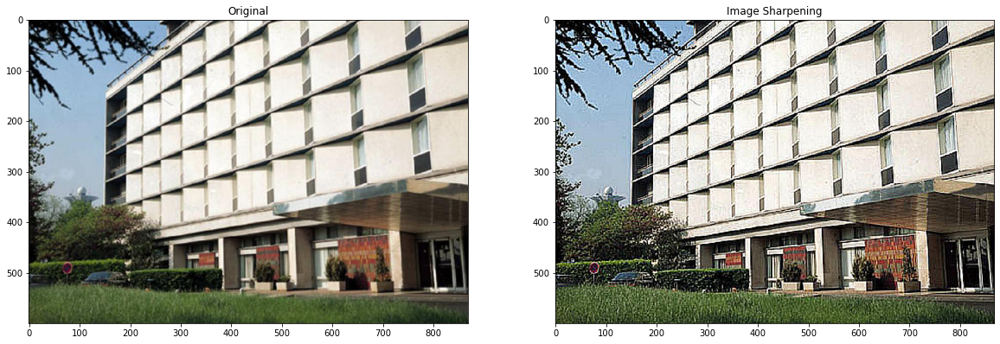

In [2]:
image = cv2.imread('archive/data/building.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)


# Create our shapening kernel, we don't normalize since the 
# the values in the matrix sum to 1
kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1,9,-1], 
                              [-1,-1,-1]])

# applying different kernels to the input image
sharpened = cv2.filter2D(image, -1, kernel_sharpening)


plt.subplot(1, 2, 2)
plt.title("Image Sharpening")
plt.imshow(sharpened)

plt.show()

<a id="2."></a> 
# 2.Thresholding, Binarization & Adaptive Thresholding

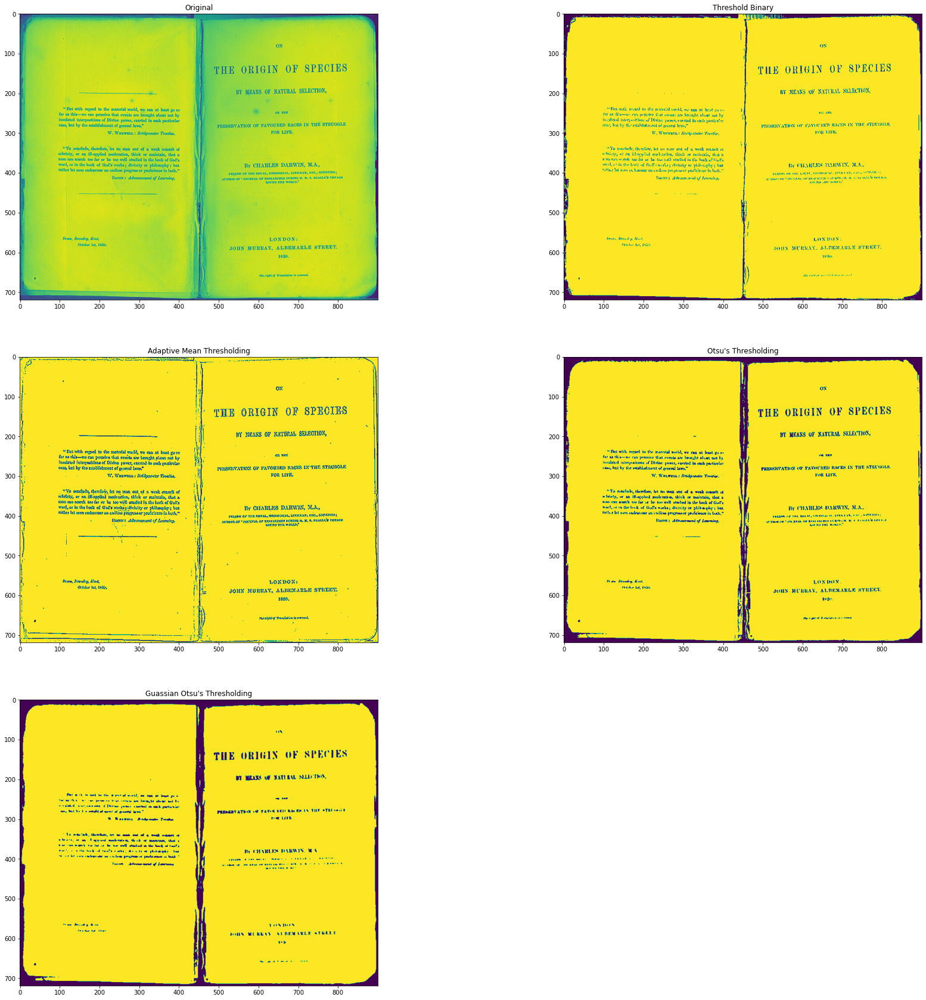

In [3]:
# Load our new image
image = cv2.imread('archive/Origin_of_Species.jpg', 0)

plt.figure(figsize=(30, 30))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)

# Values below 127 goes to 0 (black, everything above goes to 255 (white)
ret,thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

plt.subplot(3, 2, 2)
plt.title("Threshold Binary")
plt.imshow(thresh1)


# It's good practice to blur images as it removes noise
image = cv2.GaussianBlur(image, (3, 3), 0)

# Using adaptiveThreshold
thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5) 

plt.subplot(3, 2, 3)
plt.title("Adaptive Mean Thresholding")
plt.imshow(thresh)


_, th2 = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.subplot(3, 2, 4)
plt.title("Otsu's Thresholding")
plt.imshow(th2)


plt.subplot(3, 2, 5)
# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(image, (5,5), 0)
_, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.title("Guassian Otsu's Thresholding")
plt.imshow(th3)
plt.show()


<a id="3."></a> 
# 3.Dilation, Erosion, Opening and Closing

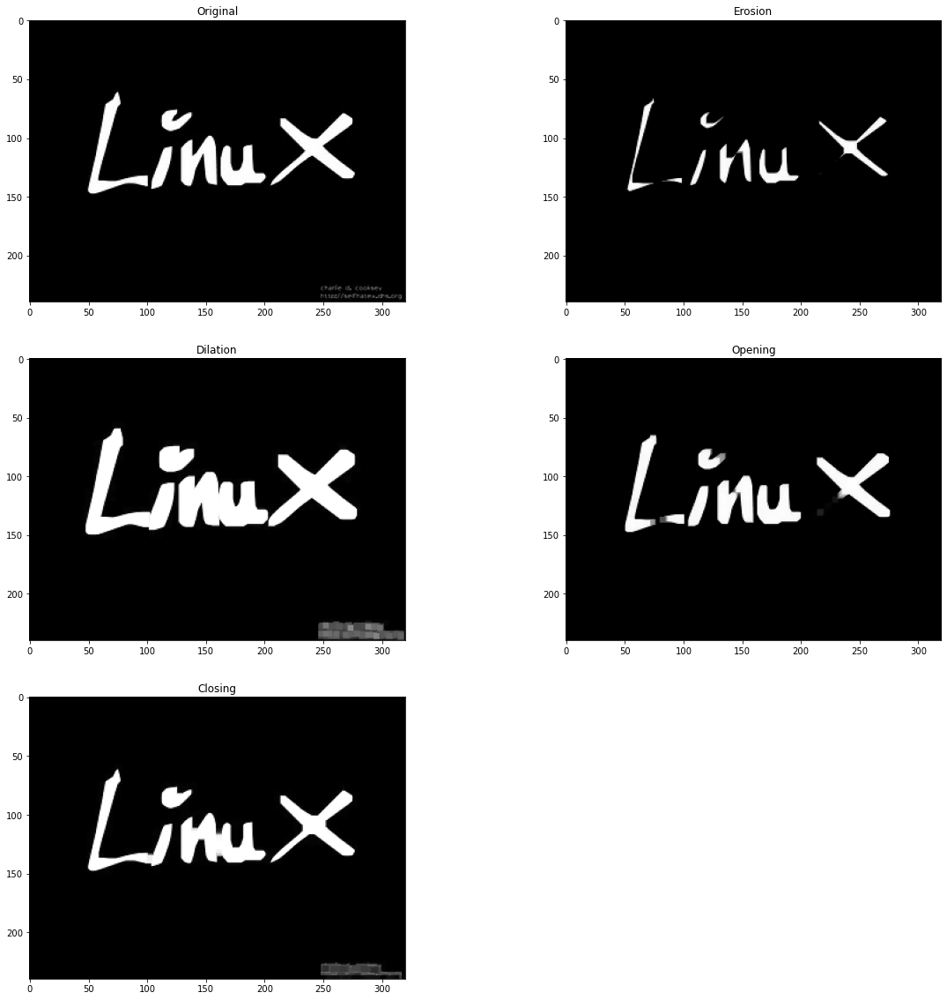

In [4]:
image = cv2.imread('archive/data/LinuxLogo.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)


# Let's define our kernel size
kernel = np.ones((5,5), np.uint8)

# Now we erode
erosion = cv2.erode(image, kernel, iterations = 1)

plt.subplot(3, 2, 2)
plt.title("Erosion")
plt.imshow(erosion)

# 
dilation = cv2.dilate(image, kernel, iterations = 1)
plt.subplot(3, 2, 3)
plt.title("Dilation")
plt.imshow(dilation)


# Opening - Good for removing noise
opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
plt.subplot(3, 2, 4)
plt.title("Opening")
plt.imshow(opening)


# Closing - Good for removing noise
closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
plt.subplot(3, 2, 5)
plt.title("Closing")
plt.imshow(closing)

<a id="4."></a> 
# 4.Edge Detection & Image Gradients


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


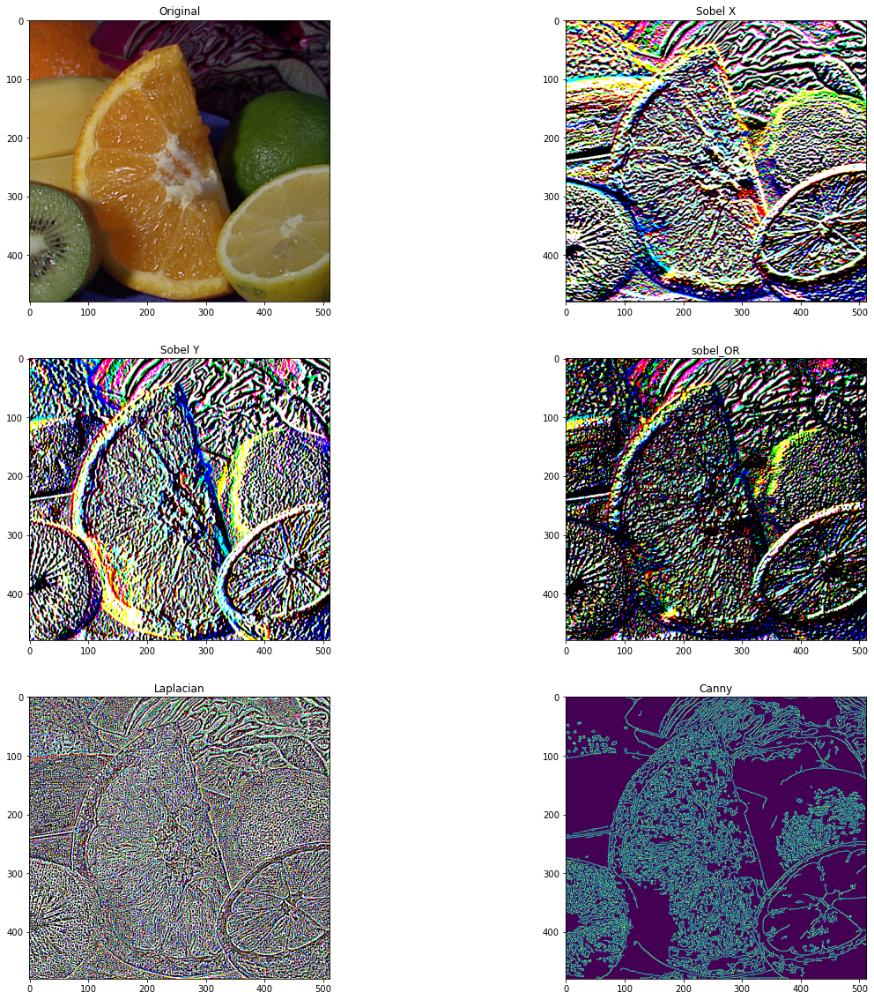

In [5]:
image = cv2.imread('archive/data/fruits.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

height, width,_ = image.shape

# Extract Sobel Edges
sobel_x = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)

plt.figure(figsize=(20, 20))

plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)

plt.subplot(3, 2, 2)
plt.title("Sobel X")
plt.imshow(sobel_x)


plt.subplot(3, 2, 3)
plt.title("Sobel Y")
plt.imshow(sobel_y)

sobel_OR = cv2.bitwise_or(sobel_x, sobel_y)

plt.subplot(3, 2, 4)
plt.title("sobel_OR")
plt.imshow(sobel_OR)

laplacian = cv2.Laplacian(image, cv2.CV_64F)

plt.subplot(3, 2, 5)
plt.title("Laplacian")
plt.imshow(laplacian)


##  Then, we need to provide two values: threshold1 and threshold2. Any gradient value larger than threshold2
# is considered to be an edge. Any value below threshold1 is considered not to be an edge. 
#Values in between threshold1 and threshold2 are either classiﬁed as edges or non-edges based on how their 
#intensities are “connected”. In this case, any gradient values below 60 are considered non-edges
#whereas any values above 120 are considered edges.


# Canny Edge Detection uses gradient values as thresholds
# The first threshold gradient
canny = cv2.Canny(image, 50, 120)

plt.subplot(3, 2, 6)
plt.title("Canny")
plt.imshow(canny)

<a id="5."></a> 
# 5.Perpsective Transform

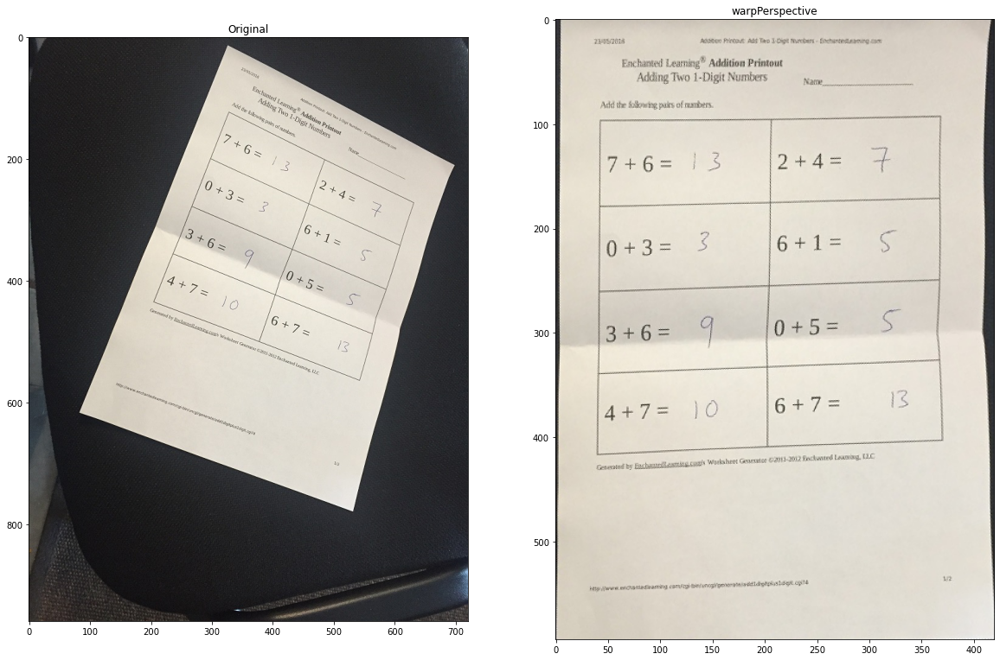

In [6]:
image = cv2.imread('archive/scan.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)

# Cordinates of the 4 corners of the original image
points_A = np.float32([[320,15], [700,215], [85,610], [530,780]])

# Cordinates of the 4 corners of the desired output
# We use a ratio of an A4 Paper 1 : 1.41
points_B = np.float32([[0,0], [420,0], [0,594], [420,594]])
 
# Use the two sets of four points to compute 
# the Perspective Transformation matrix, M    
M = cv2.getPerspectiveTransform(points_A, points_B)
 
warped = cv2.warpPerspective(image, M, (420,594))

plt.subplot(1, 2, 2)
plt.title("warpPerspective")
plt.imshow(warped)



<a id="6."></a> 
# 6.Scaling, re-sizing and interpolations

Re-sizing is very easy using the cv2.resize function, it's arguments are: cv2.resize(image, dsize(output image size), x scale, y scale, interpolation)

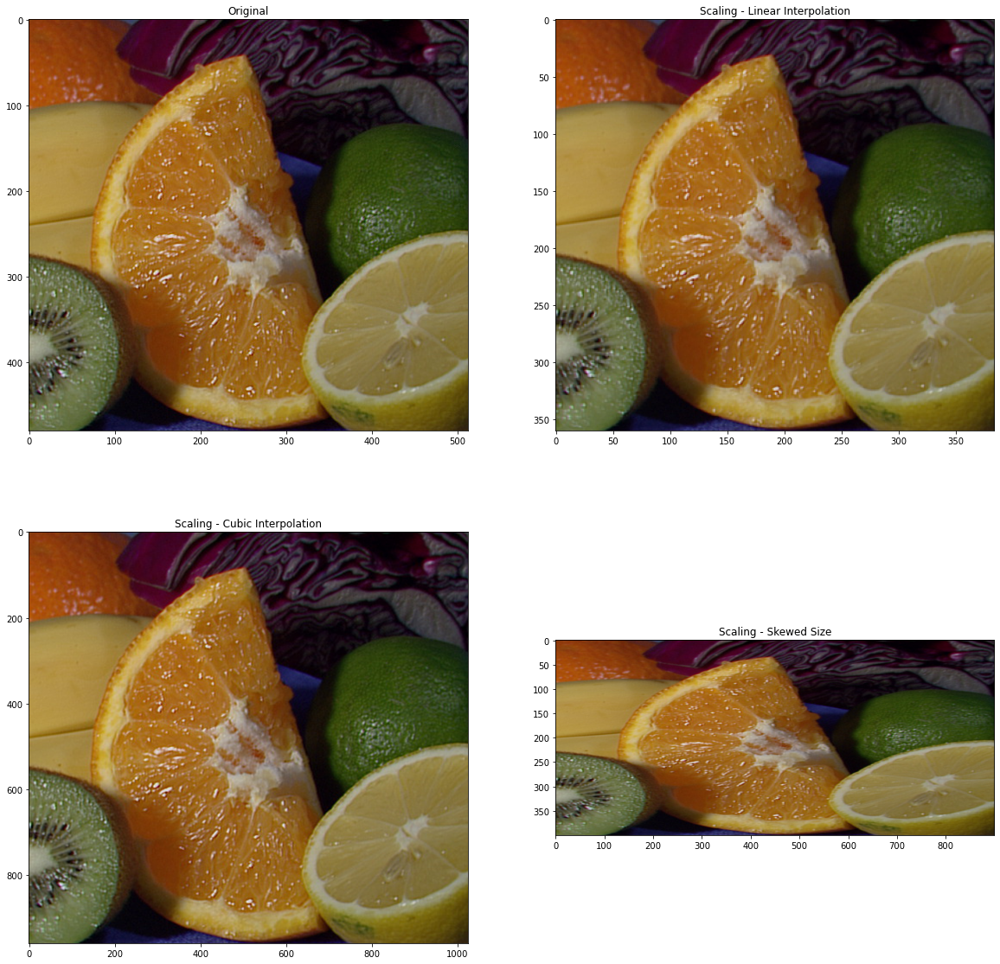

In [7]:
image = cv2.imread('archive/data/fruits.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Let's make our image 3/4 of it's original size
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)

plt.subplot(2, 2, 2)
plt.title("Scaling - Linear Interpolation")
plt.imshow(image_scaled)

# Let's double the size of our image
img_scaled = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)

plt.subplot(2, 2, 3)
plt.title("Scaling - Cubic Interpolation")
plt.imshow(img_scaled)

# Let's skew the re-sizing by setting exact dimensions
img_scaled = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)

plt.subplot(2, 2, 4)
plt.title("Scaling - Skewed Size")
plt.imshow(img_scaled)

<a id="7."></a> 
# 7.Image Pyramids
Useful when scaling images in object detection.

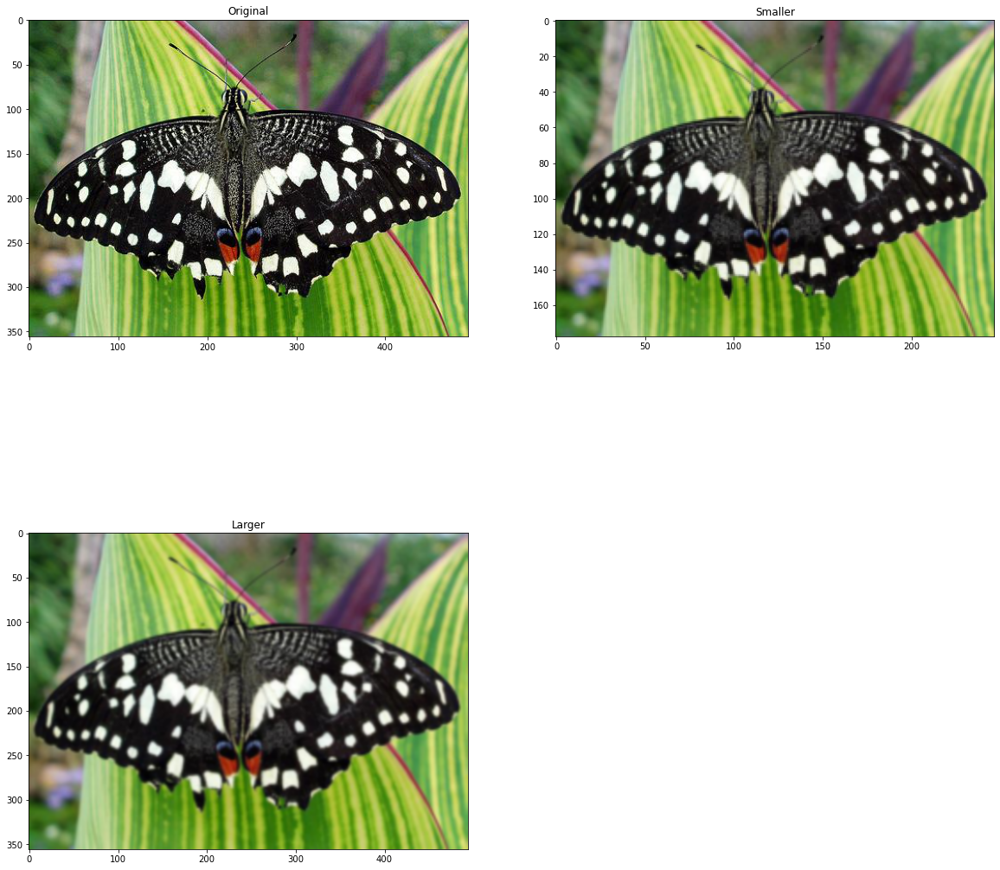

In [8]:
image = cv2.imread('archive/data/butterfly.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

smaller = cv2.pyrDown(image)
larger = cv2.pyrUp(smaller)

plt.subplot(2, 2, 2)
plt.title("Smaller")
plt.imshow(smaller)

plt.subplot(2, 2, 3)
plt.title("Larger")
plt.imshow(larger)


<a id="8."></a> 
# 8.Cropping

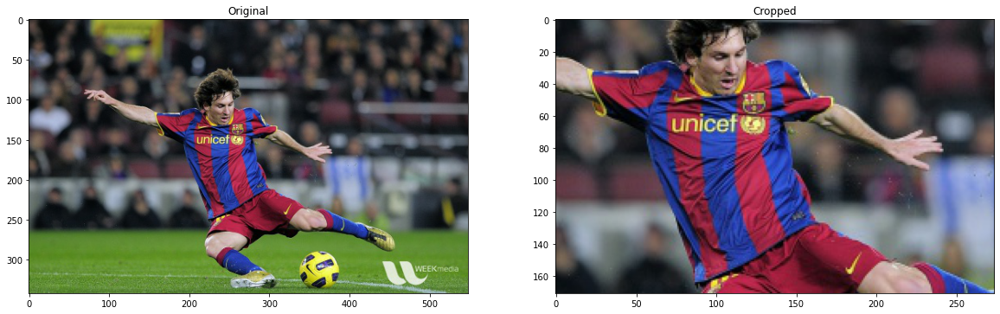

In [9]:
image = cv2.imread('archive/data/messi5.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

height, width = image.shape[:2]

# Let's get the starting pixel coordiantes (top  left of cropping rectangle)
start_row, start_col = int(height * .25), int(width * .25)

# Let's get the ending pixel coordinates (bottom right)
end_row, end_col = int(height * .75), int(width * .75)

# Simply use indexing to crop out the rectangle we desire
cropped = image[start_row:end_row , start_col:end_col]


plt.subplot(2, 2, 2)
plt.title("Cropped")
plt.imshow(cropped)

<a id="9."></a> 
# 9.Blurring


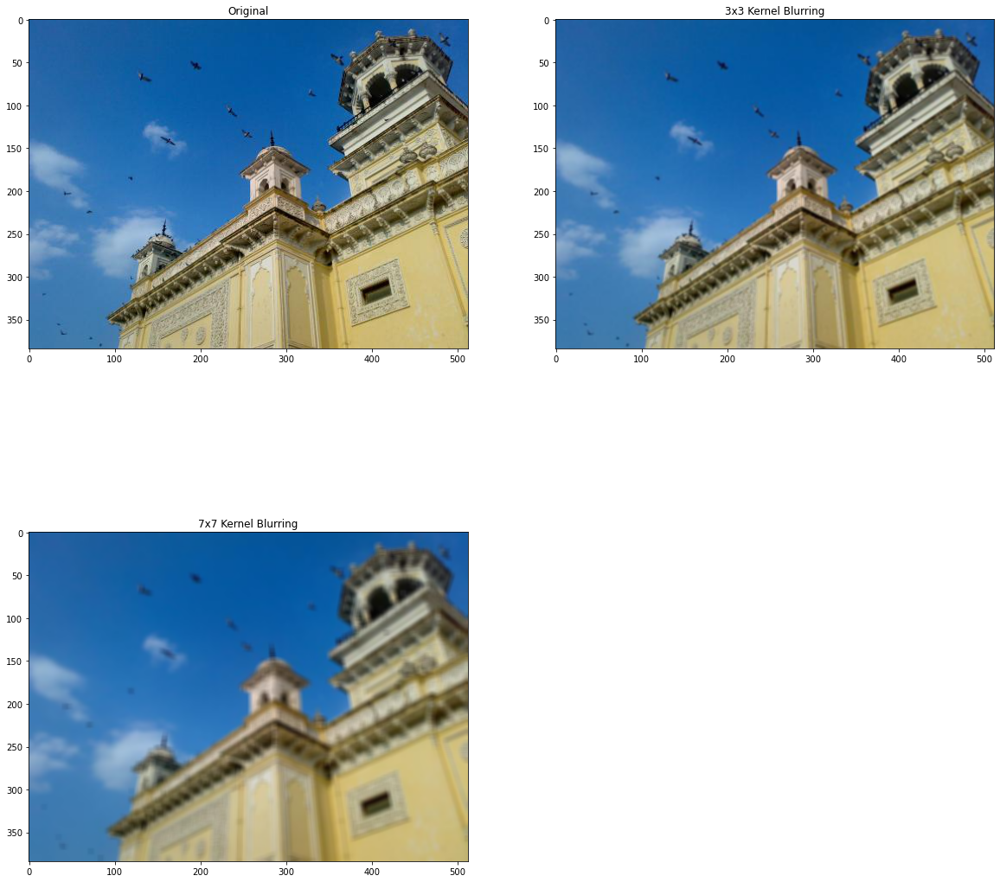

In [10]:
image = cv2.imread('archive/data/home.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Creating our 3 x 3 kernel
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# We use the cv2.fitler2D to conovlve the kernal with an image 
blurred = cv2.filter2D(image, -1, kernel_3x3)

plt.subplot(2, 2, 2)
plt.title("3x3 Kernel Blurring")
plt.imshow(blurred)

# Creating our 7 x 7 kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)

plt.subplot(2, 2, 3)
plt.title("7x7 Kernel Blurring")
plt.imshow(blurred2)


<a id="10."></a> 
# 10.Contours


Number of Contours found = 4


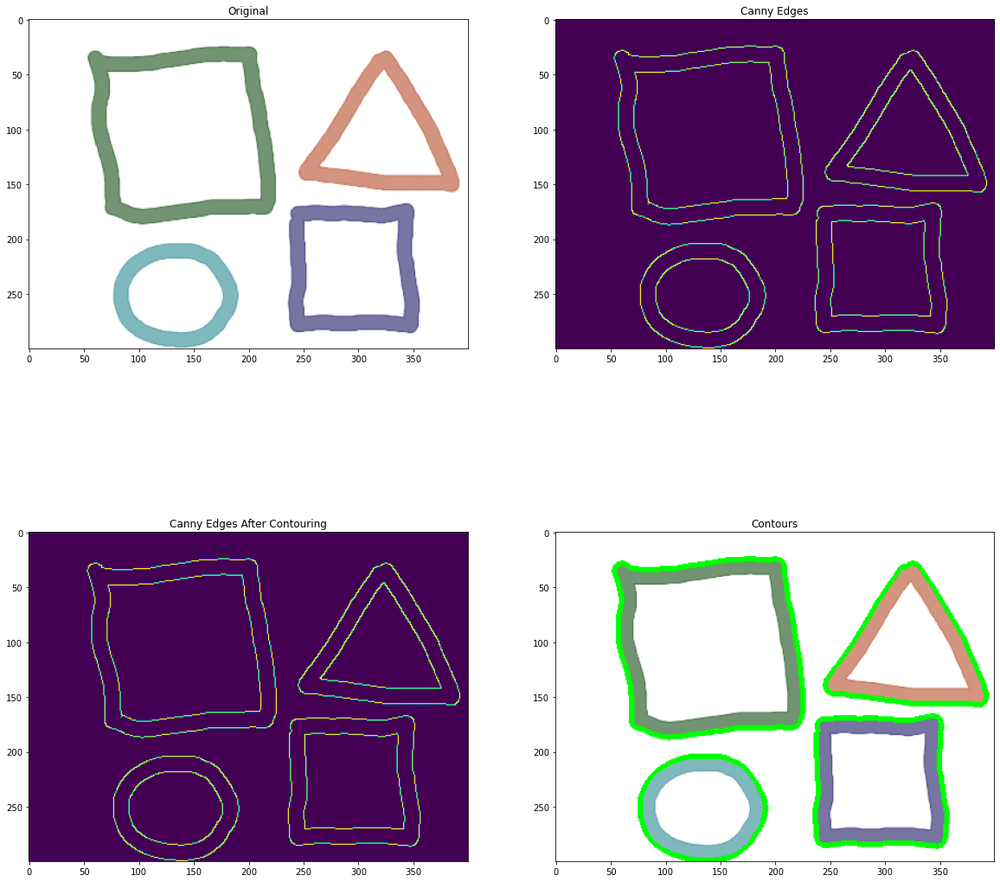

In [11]:
# Let's load a simple image with 3 black squares
image = cv2.imread('archive/data/pic3.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)


# Grayscale
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

# Find Canny edges
edged = cv2.Canny(gray, 30, 200)

plt.subplot(2, 2, 2)
plt.title("Canny Edges")
plt.imshow(edged)


# Finding Contours
# Use a copy of your image e.g. edged.copy(), since findContours alters the image
contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

plt.subplot(2, 2, 3)
plt.title("Canny Edges After Contouring")
plt.imshow(edged)

print("Number of Contours found = " + str(len(contours)))

# Draw all contours
# Use '-1' as the 3rd parameter to draw all
cv2.drawContours(image, contours, -1, (0,255,0), 3)

plt.subplot(2, 2, 4)
plt.title("Contours")
plt.imshow(image)

<a id="11."></a> 
# 11.Approximating Contours and Convex Hull

cv2.approxPolyDP(contour, Approximation Accuracy, Closed)

* contour – is the individual contour we wish to approximate
* Approximation Accuracy – Important parameter is determining the accuracy of the approximation. Small values give precise- approximations, large values give more generic approximation. A good rule of thumb is less than 5% of the contour perimeter
* Closed – a Boolean value that states whether the approximate contour should be open or closed


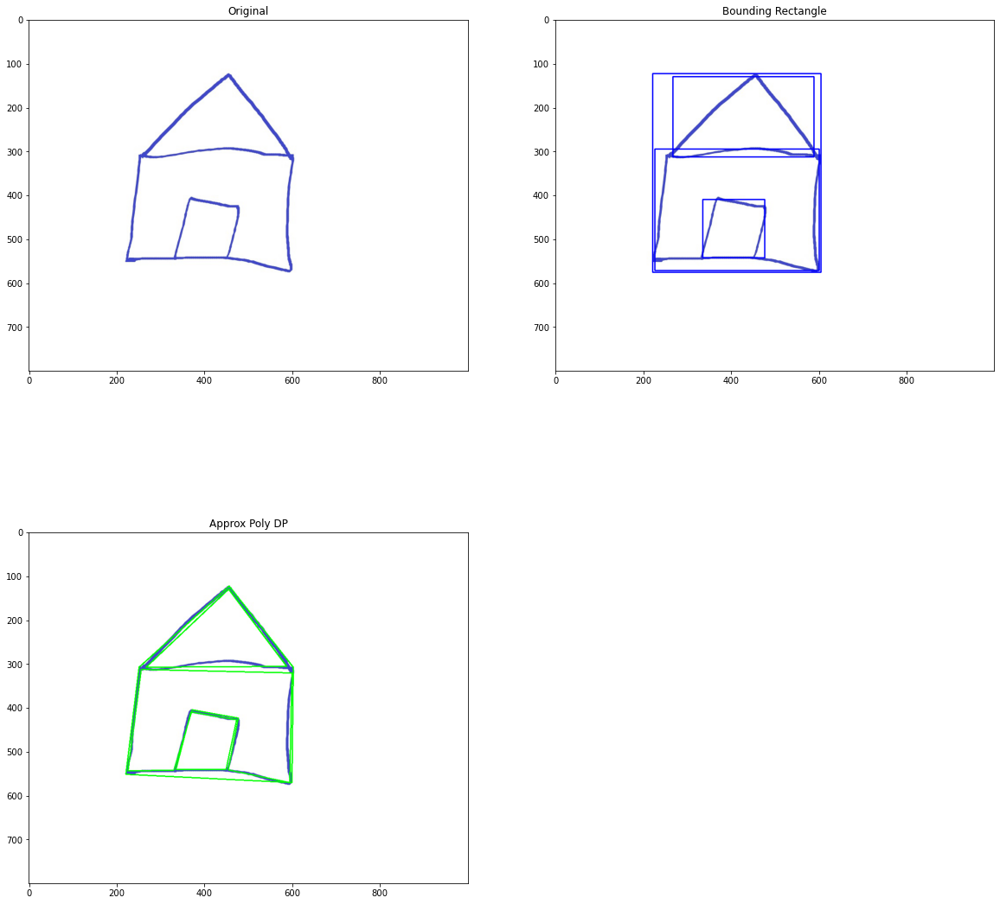

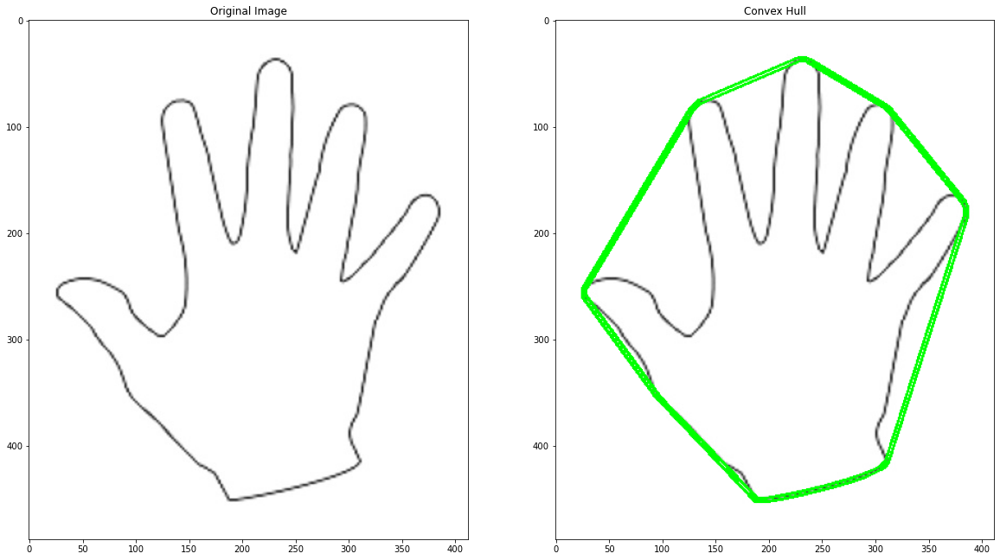

In [12]:
# Load image and keep a copy
image = cv2.imread('archive/house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

orig_image = image.copy()


# Grayscale and binarize
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)

# Find contours 
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# Iterate through each contour and compute the bounding rectangle
for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(orig_image,(x,y),(x+w,y+h),(0,0,255),2)    
    plt.subplot(2, 2, 2)
    plt.title("Bounding Rectangle")
    plt.imshow(orig_image)

cv2.waitKey(0) 
    
# Iterate through each contour and compute the approx contour
for c in contours:
    # Calculate accuracy as a percent of the contour perimeter
    accuracy = 0.03 * cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, accuracy, True)
    cv2.drawContours(image, [approx], 0, (0, 255, 0), 2)
    
    plt.subplot(2, 2, 3)
    plt.title("Approx Poly DP")
    plt.imshow(image)

plt.show()
    
# Convex Hull


image = cv2.imread('archive/hand.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)

# Threshold the image
ret, thresh = cv2.threshold(gray, 176, 255, 0)

# Find contours 
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    
# Sort Contors by area and then remove the largest frame contour
n = len(contours) - 1
contours = sorted(contours, key=cv2.contourArea, reverse=False)[:n]

# Iterate through contours and draw the convex hull
for c in contours:
    hull = cv2.convexHull(c)
    cv2.drawContours(image, [hull], 0, (0, 255, 0), 2)

    plt.subplot(1, 2, 2)
    plt.title("Convex Hull")
    plt.imshow(image)

<a id="12."></a> 
# 12.Identifiy Contours by Shape

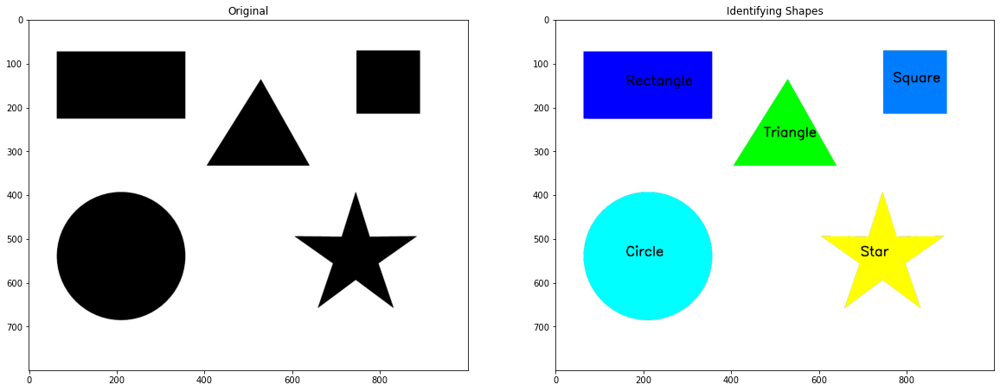

In [13]:
image = cv2.imread('archive/someshapes.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

ret, thresh = cv2.threshold(gray, 127, 255, 1)

# Extract Contours
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

for cnt in contours:
    
    # Get approximate polygons
    approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt,True),True)
    
    if len(approx) == 3:
        shape_name = "Triangle"
        cv2.drawContours(image,[cnt],0,(0,255,0),-1)
        
        # Find contour center to place text at the center
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
    
    elif len(approx) == 4:
        x,y,w,h = cv2.boundingRect(cnt)
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        
        # Check to see if 4-side polygon is square or rectangle
        # cv2.boundingRect returns the top left and then width and 
        if abs(w-h) <= 3:
            shape_name = "Square"
            
            # Find contour center to place text at the center
            cv2.drawContours(image, [cnt], 0, (0, 125 ,255), -1)
            cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
        else:
            shape_name = "Rectangle"
            
            # Find contour center to place text at the center
            cv2.drawContours(image, [cnt], 0, (0, 0, 255), -1)
            M = cv2.moments(cnt)
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
            
    elif len(approx) == 10:
        shape_name = "Star"
        cv2.drawContours(image, [cnt], 0, (255, 255, 0), -1)
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
        
        
        
    elif len(approx) >= 15:
        shape_name = "Circle"
        cv2.drawContours(image, [cnt], 0, (0, 255, 255), -1)
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

plt.subplot(2, 2, 2)
plt.title("Identifying Shapes")
plt.imshow(image)

<a id="13."></a> 
# 13.Line Detection - Using Hough Lines

cv2.HoughLines(binarized/thresholded image, 𝜌 accuracy, 𝜃 accuracy, threshold)

* Threshold here is the minimum vote for it to be considered a line


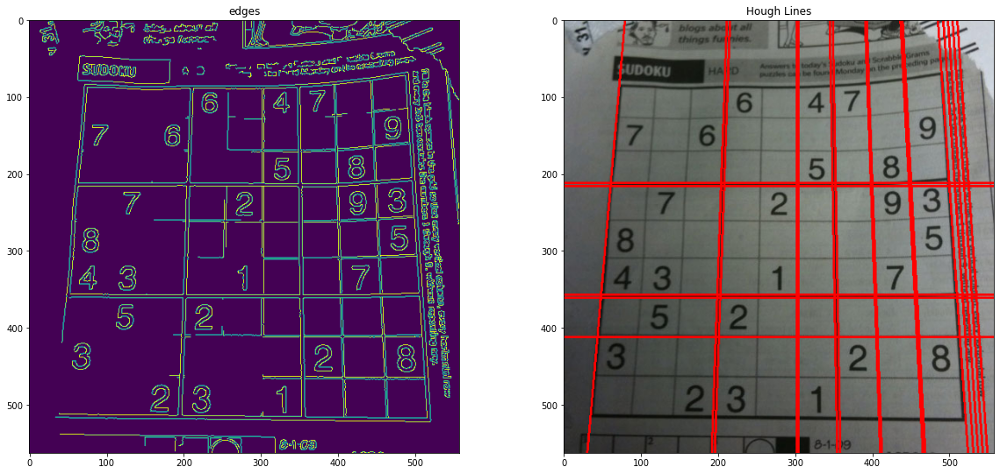

In [14]:
image = cv2.imread('archive/data/sudoku.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

# Grayscale and Canny Edges extracted
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 170, apertureSize = 3)

plt.subplot(2, 2, 1)
plt.title("edges")
plt.imshow(edges)

# Run HoughLines using a rho accuracy of 1 pixel
# theta accuracy of np.pi / 180 which is 1 degree
# Our line threshold is set to 240 (number of points on line)
lines = cv2.HoughLines(edges, 1, np.pi/180, 200)

# We iterate through each line and convert it to the format
# required by cv.lines (i.e. requiring end points)
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(image, (x1, y1), (x2, y2), (255, 0, 0), 2)


plt.subplot(2, 2, 2)
plt.title("Hough Lines")
plt.imshow(image)

<a id="14."></a> 
# 14.Counting Circles and Ellipses

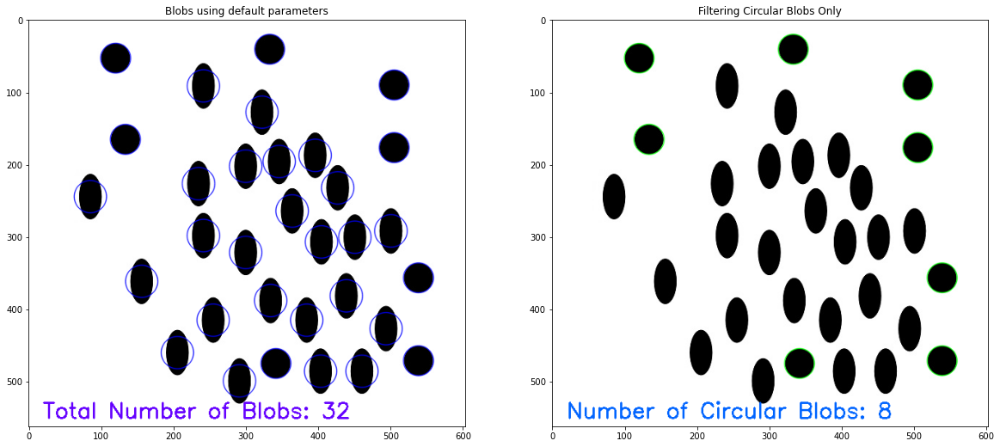

In [15]:
image = cv2.imread('archive/blobs.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))


# Intialize the detector using the default parameters
detector = cv2.SimpleBlobDetector_create()
 
# Detect blobs
keypoints = detector.detect(image)
 
# Draw blobs on our image as red circles
blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,0,255),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

number_of_blobs = len(keypoints)
text = "Total Number of Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (100, 0, 255), 2)

# Display image with blob keypoints
plt.subplot(2, 2, 1)
plt.title("Blobs using default parameters")
plt.imshow(blobs)


# Set our filtering parameters
# Initialize parameter settiing using cv2.SimpleBlobDetector
params = cv2.SimpleBlobDetector_Params()

# Set Area filtering parameters
params.filterByArea = True
params.minArea = 100

# Set Circularity filtering parameters
params.filterByCircularity = True 
params.minCircularity = 0.9

# Set Convexity filtering parameters
params.filterByConvexity = False
params.minConvexity = 0.2
    
# Set inertia filtering parameters
params.filterByInertia = True
params.minInertiaRatio = 0.01

# Create a detector with the parameters
detector = cv2.SimpleBlobDetector_create(params)
    
# Detect blobs
keypoints = detector.detect(image)

# Draw blobs on our image as red circles
blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,255,0),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

number_of_blobs = len(keypoints)
text = "Number of Circular Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2)

# Show blobs
plt.subplot(2, 2, 2)
plt.title("Filtering Circular Blobs Only")
plt.imshow(blobs)

<a id="15."></a> 
# 15.Finding Corners

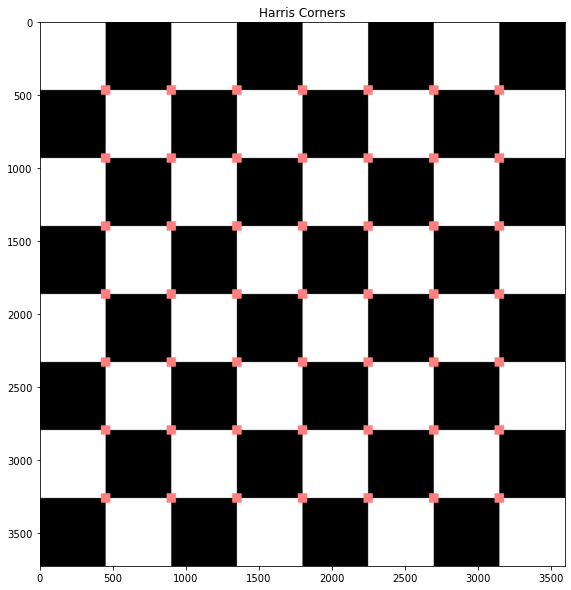

In [16]:
# Load image then grayscale
image = cv2.imread('archive/data/chessboard.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# The cornerHarris function requires the array datatype to be float32
gray = np.float32(gray)

harris_corners = cv2.cornerHarris(gray, 3, 3, 0.05)

#We use dilation of the corner points to enlarge them\
kernel = np.ones((7,7),np.uint8)
harris_corners = cv2.dilate(harris_corners, kernel, iterations = 10)

# Threshold for an optimal value, it may vary depending on the image.
image[harris_corners > 0.025 * harris_corners.max() ] = [255, 127, 127]

plt.subplot(1, 1, 1)
plt.title("Harris Corners")
plt.imshow(image)

<a id="16."></a> 
# 16.Finding Waldo

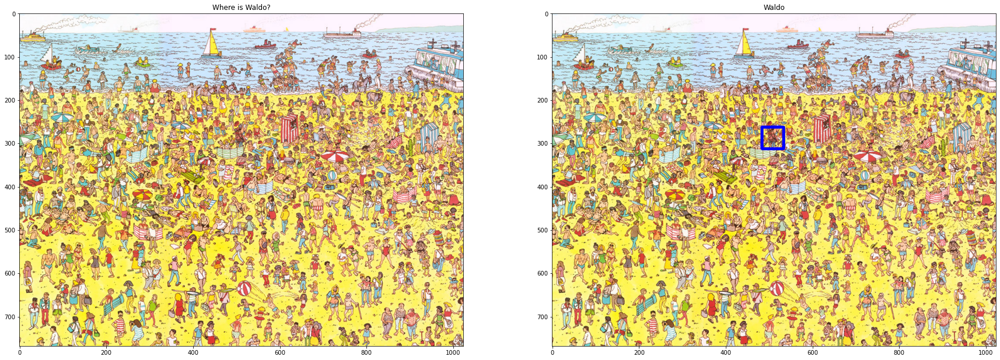

In [17]:
# Load input image and convert to grayscale
image = cv2.imread('archive/WaldoBeach.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30, 30))

plt.subplot(2, 2, 1)
plt.title("Where is Waldo?")
plt.imshow(image)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Load Template image
template = cv2.imread('archive/waldo.jpg',0)

result = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

#Create Bounding Box
top_left = max_loc
bottom_right = (top_left[0] + 50, top_left[1] + 50)
cv2.rectangle(image, top_left, bottom_right, (0,0,255), 5)

plt.subplot(2, 2, 2)
plt.title("Waldo")
plt.imshow(image)

<a id="17."></a> 
# 17.Background Subtraction Methods

source: https://docs.opencv.org/3.4/d1/dc5/tutorial_background_subtraction.html

## How to Use Background Subtraction Methods

Background subtraction (BS) is a common and widely used technique for generating a foreground mask (namely, a binary image containing the pixels belonging to moving objects in the scene) by using static cameras.

As the name suggests, BS calculates the foreground mask performing a subtraction between the current frame and a background model, containing the static part of the scene or, more in general, everything that can be considered as background given the characteristics of the observed scene.

![](https://docs.opencv.org/3.4/Background_Subtraction_Tutorial_Scheme.png)



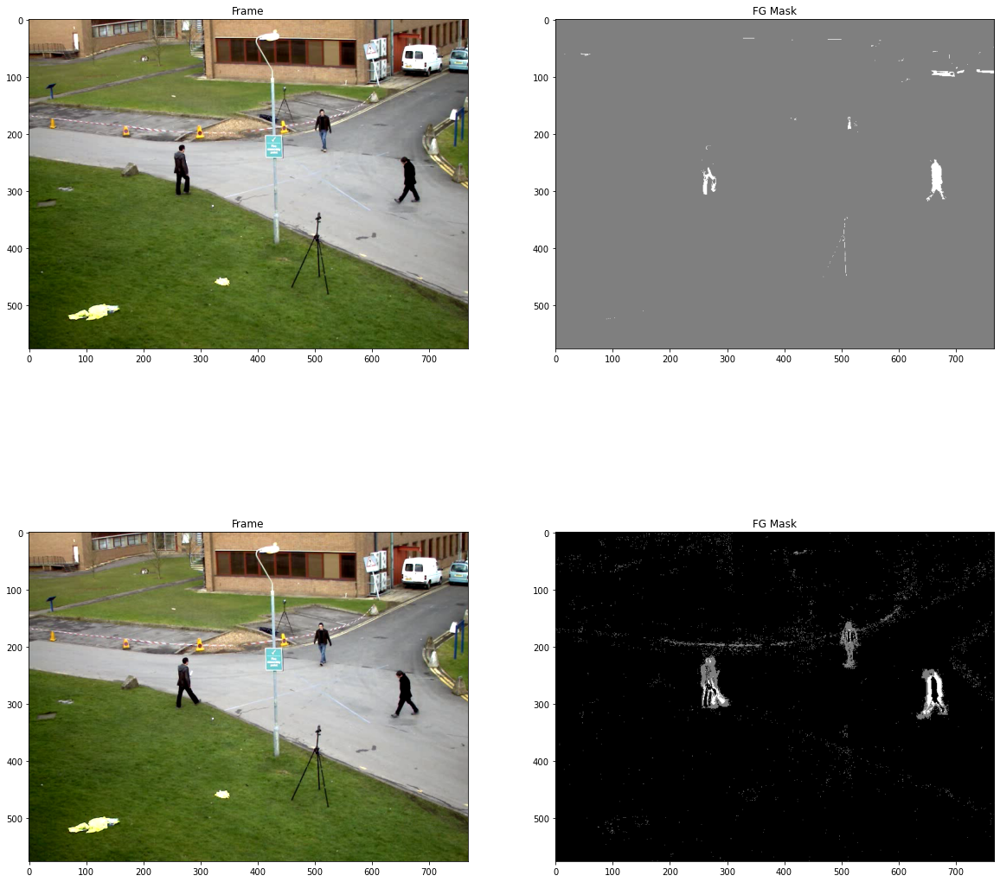

In [18]:
import cv2 
import matplotlib.pyplot as plt

algo = 'MOG2'

if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
else:
    backSub = cv2.createBackgroundSubtractorKNN()

plt.figure(figsize=(20, 20))

frame = cv2.imread('archive/Background_Subtraction_Tutorial_frame.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 1)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 2)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))
                       
frame = cv2.imread('archive/Background_Subtraction_Tutorial_frame_1.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 3)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 4)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

## If you want to run it on video and locally, you must set it to (While) True. (Do not try on Kaggle you will get the error)



In [19]:
import cv2
import numpy as np

algo = 'MOG2'
inputt = 'archive/video_input/Background_Subtraction_Tutorial_frame.mp4'

capture = cv2.VideoCapture(cv2.samples.findFileOrKeep(inputt))
frame_width = int(capture.get(3))
frame_height = int(capture.get(4))

out = cv2.VideoWriter('Background_Subtraction_Tutorial_frame_output.mp4',cv2.VideoWriter_fourcc('M','J','P','G'),30, (frame_width,frame_height))

if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
else:
    backSub = cv2.createBackgroundSubtractorKNN()

# If you want to run it on video and locally, you must set it to (While) True. (Do not try on Kaggle you will get the error)
while False:
    
    ret, frame = capture.read()
    
    if frame is None:
        break
    
    fgMask = backSub.apply(frame)
    
    cv2.rectangle(frame, (10, 2), (100,20), (255,255,255), -1)

    cv2.imshow('Frame', frame)
    cv2.imshow('FG Mask', fgMask)
    
    out.write(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))
    
    keyboard = cv2.waitKey(1) & 0xFF;
        
    if (keyboard == 27 or keyboard == ord('q')):
        cv2.destroyAllWindows()
        break;
        
capture.release()
out.release()
cv2.destroyAllWindows()

## The result you will get on video and locally

![](https://iili.io/JMXhdv.gif)

<a id="18."></a> 
# 18.Funny Mirrors Using OpenCV
Source: https://www.learnopencv.com/funny-mirrors-using-opencv/

Funny mirrors are not plane mirrors but a combination of convex/concave reflective surfaces that produce distortion effects that look funny as we move in front of these mirrors.

### How does it work ?
The entire project can be divided into three major steps :

* Create a virtual camera.
* Define a 3D surface (the mirror surface) and project it into the virtual camera using a suitable value of projection matrix.
* Use the image coordinates of the projected points of the 3D surface to apply mesh based warping to get the desired effect of a funny mirror.

![](https://www.learnopencv.com/wp-content/uploads/2020/04/steps-for-funny-mirrors.jpg)



In [20]:
!pip install vcam

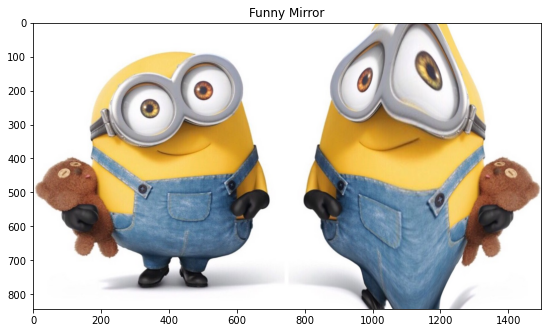

In [21]:
import cv2
import numpy as np
import math
from vcam import vcam,meshGen
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))

# Reading the input image. Pass the path of image you would like to use as input image.
img = cv2.imread("archive/minions.jpg")
H,W = img.shape[:2]

# Creating the virtual camera object
c1 = vcam(H=H,W=W)

# Creating the surface object
plane = meshGen(H,W)

# We generate a mirror where for each 3D point, its Z coordinate is defined as Z = 20*exp^((x/w)^2 / 2*0.1*sqrt(2*pi))

plane.Z += 20*np.exp(-0.5*((plane.X*1.0/plane.W)/0.1)**2)/(0.1*np.sqrt(2*np.pi))
pts3d = plane.getPlane()

pts2d = c1.project(pts3d)
map_x,map_y = c1.getMaps(pts2d)

output = cv2.remap(img,map_x,map_y,interpolation=cv2.INTER_LINEAR)

plt.subplot(1, 2,1)
plt.title("Funny Mirror")
plt.imshow(cv2.cvtColor(np.hstack((img,output)), cv2.COLOR_BGR2RGB))

So now as we know that by defining Z as a function of X and Y we can create different types of distortion effects. Let us create some more effects using the above code. We simply need to change the line where we define Z as a function of X and Y. This will further help you to create your own effects.

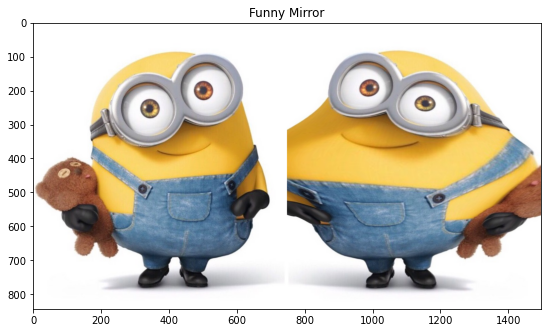

In [23]:
plt.figure(figsize=(20, 20))

# Reading the input image. Pass the path of image you would like to use as input image.
img = cv2.imread("archive/minions.jpg")
H,W = img.shape[:2]

# Creating the virtual camera object
c1 = vcam(H=H,W=W)

# Creating the surface object
plane = meshGen(H,W)

# We generate a mirror where for each 3D point, its Z coordinate is defined as Z = 20*exp^((y/h)^2 / 2*0.1*sqrt(2*pi))
plane.Z += 20*np.exp(-0.5*((plane.Y*1.0/plane.H)/0.1)**2)/(0.1*np.sqrt(2*np.pi))

pts3d = plane.getPlane()

pts2d = c1.project(pts3d)
map_x,map_y = c1.getMaps(pts2d)

output = cv2.remap(img,map_x,map_y,interpolation=cv2.INTER_LINEAR)

plt.subplot(1, 2,1)
plt.title("Funny Mirror")
plt.imshow(cv2.cvtColor(np.hstack((img,output)), cv2.COLOR_BGR2RGB))

Let’s create something using sine function !

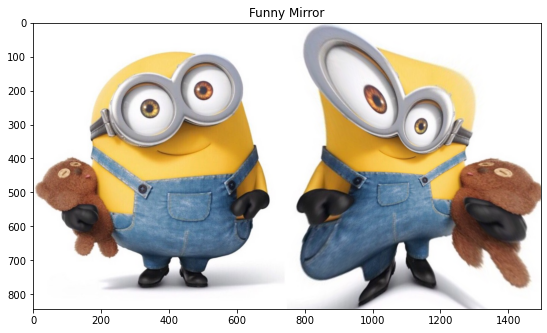

In [24]:
plt.figure(figsize=(20, 20))

# Reading the input image. Pass the path of image you would like to use as input image.
img = cv2.imread("archive/minions.jpg")
H,W = img.shape[:2]

# Creating the virtual camera object
c1 = vcam(H=H,W=W)

# Creating the surface object
plane = meshGen(H,W)

# We generate a mirror where for each 3D point, its Z coordinate is defined as Z = 20*[ sin(2*pi*(x/w-1/4))) + sin(2*pi*(y/h-1/4))) ]

plane.Z += 20*np.sin(2*np.pi*((plane.X-plane.W/4.0)/plane.W)) + 20*np.sin(2*np.pi*((plane.Y-plane.H/4.0)/plane.H))

pts3d = plane.getPlane()

pts2d = c1.project(pts3d)
map_x,map_y = c1.getMaps(pts2d)

output = cv2.remap(img,map_x,map_y,interpolation=cv2.INTER_LINEAR)

plt.subplot(1, 2,1)
plt.title("Funny Mirror")
plt.imshow(cv2.cvtColor(np.hstack((img,output)), cv2.COLOR_BGR2RGB))